In [301]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import scipy.stats as stats

In [302]:
df = pd.read_csv("../FARS_GESCRSS_Sample_2001-2020.csv", low_memory= False)

keep_cols = ['ST_CASE', 'VEH_NO', 'PER_NO', 'AGE', 'GENDER', 'YEAR', 'PER_TYP', 'INJ_SEV', 'DRINKING', 'DRUGS', 'NUMOCCS', 'MAKE',
             'MOD_YEAR', 'HIT_RUN', 'BODY_TYP', 'DEFORMED', 'SPEEDREL', 'HARM_EV', 'HOUR', 'WEATHER',]

df = df[keep_cols]

df["ST_CASE"] = df["ST_CASE"].astype(int)
df["TIME"] = df["HOUR"].apply(lambda x: "morning" if (x >= 5 and x <13) 
                              else ("afternoon" if x >= 13 and x < 20 else "night"))

We start our analysis with a search through our dataset for missing values. The original dataset is large with 1,583,520 observations. The percent of values missing can be seen in the table below. The variables withe the highest missing values are the indicators for whether the individual involved in the crash was drugs and or was drinking at 37$ and 30% respectively. The variable deformed, which measures vehicle damage has a high missing percentage at 20%. The variable which indicates whether speed was related to the crash is missing at 19%. Several other variables are missing at rates of less than 5%. Since our dataset is large enough, we can afford to simply drop missing observations with high degrees of missingness when building our predictive model. After dropping missing values, the number of observations is 637,766.

In [303]:
missing = pd.DataFrame((df.isna().sum(axis = 0) / df.shape[0] * 100)
                       .sort_values(ascending = False)
                       .rename("Percent Missing")
                       ).query("`Percent Missing` > 0")
missing.to_csv("assets/missing.csv", index=True)
missing

,Percent Missing
DRUGS,36.816232
DRINKING,29.970044
DEFORMED,20.662191
SPEEDREL,19.420301
AGE,5.180976
NUMOCCS,4.582313
MOD_YEAR,4.023976
MAKE,3.585556
GENDER,2.963121
BODY_TYP,2.927629


In [304]:
pd.read_csv("assets/missing.csv", index_col = 0)

,Percent Missing
DRUGS,36.816232
DRINKING,29.970044
DEFORMED,20.662191
SPEEDREL,19.420301
AGE,5.180976
NUMOCCS,4.582313
MOD_YEAR,4.023976
MAKE,3.585556
GENDER,2.963121
BODY_TYP,2.927629


In [305]:
df = df.dropna()

The purpose of our project is to analyze accident severity in the form of injury severity and severity of vehicle damage. Below are the histograms of these two distributions. We can see that 

In [306]:
df["INJ_SEV"].value_counts()

INJ_SEV
0.0    465288
1.0     74727
2.0     42341
4.0     35299
3.0     20111
Name: count, dtype: int64

In [307]:
inj_sev_map = {0:"None", 1: "Possible", 2: "Minor", 3:"Major", 4:"Fatal"}
inj_df = df.groupby(["ST_CASE"])[["INJ_SEV"]].max()

fig = go.Figure()

fig.add_trace(go.Histogram(x=inj_df["INJ_SEV"].replace(inj_sev_map), 
                           histnorm='probability density',
                           customdata=(inj_df["INJ_SEV"]
                                       .value_counts(normalize=True)
                                       [[0,1,2,3,4]]
                                       .values * 100),
                           texttemplate="%{customdata:.2f}%",  
                           textposition="outside"))

fig.update_layout(title=dict(text="Injury Severity", x=0.5),
                  width = 600, height = 400,
                  yaxis=dict(range=[0, 0.8]),
                  margin=dict(l=30, r=30, t=45, b=30))

fig.update_xaxes(categoryorder="array", 
                 categoryarray=["None", "Possible", "Minor", "Major", "Fatal"],)

fig.write_image("assets/injury_severity_histogram.png", scale = 4)
fig.show()

In [308]:
deformed_map = {0:"None", 2: "Minor", 4: "Moderate", 6:"Severe"}
deformed_df = df.groupby(["ST_CASE"])[["DEFORMED"]].max()

fig = go.Figure()
fig.add_trace(go.Histogram(x=deformed_df["DEFORMED"].replace(deformed_map),
                           histnorm='probability density',
                           customdata=(deformed_df.value_counts(normalize=True)
                                       [[0,2,4,6]]
                                       .values * 100),
                           texttemplate="%{customdata:.2f}%",  
                           textposition="outside"))
fig.update_layout(title=dict(text="Vehicle Deformity", x=0.5),
                  width = 600, height = 400,
                  yaxis=dict(range=[0, 0.6]),
                  margin=dict(l=30, r=30, t=45, b=30))
fig.update_xaxes(categoryorder="array", 
                 categoryarray=["None", "Minor", "Moderate", "Severe"],)

fig.write_image("assets/vehicle_deformity_histogram.png")
fig.show()

In [309]:
feats = ["DRINKING", "DRUGS", "SPEEDREL", "WEATHER", "TIME"]
responses = ["INJ_SEV", "DEFORMED"]

drinking_map = {0:"No", 1:"Yes"}
drugs_map = {0:"No", 1:"Yes"}
speed_map = {0:"No", 1:"Yes"}
weather_map = {0:"No", 1:"Yes"}
time_map = {'morning': "morning", "afternoon": "Afternoon", "night":"Night"}

inj_sev_map = {0:"None", 1: "Possible", 2: "Minor", 3:"Major", 4:"Fatal"}
inj_sev_order = ["None", "Possible", "Minor", "Major", "Fatal"]

deformity_map = {0:"None", 2: "Minor", 4: "Moderate", 6:"Severe"}
deformity_order = ["None", "Minor", "Moderate", "Severe"]

feat_maps = [drinking_map, drugs_map, speed_map, weather_map, time_map]

contingency_tables = []

df_responses = df.groupby(["ST_CASE"])[feats + responses].max()

def run_chi2_test_inj(feature, feature_map):

    contingency_table = pd.crosstab(df_responses[feature].map(feature_map), 
                                    df_responses["INJ_SEV"].map(inj_sev_map)
                        )[inj_sev_order]
    
    chi2, p, dof, expected = stats.chi2_contingency(contingency_table)

    contingency_table.to_csv(f"assets/contingencies/contingency_{feature}_INJ_SEV.csv", index=True)

    contingency_tables.append(contingency_table)

    return chi2

def run_chi2_test_def(feature, feature_map):

    deformed_df = df.groupby(["ST_CASE"])[feats + ["DEFORMED"]].max()

    contingency_table = pd.crosstab(df_responses[feature].map(feature_map), 
                                    df_responses["DEFORMED"].map(deformed_map)
                        )[deformity_order]
    
    chi2, p, dof, expected = stats.chi2_contingency(contingency_table)

    contingency_table.to_csv(f"assets/contingencies/contingency_{feature}_DEFORMED.csv", index=True)

    contingency_tables.append(contingency_table)

    return chi2

t_stats = pd.DataFrame(index=["Drinking", "Drugs", "Speed Related", "Weather Related", "Time"], 
                       columns = ["Injury Severity", "Vehicle Deformity"])

for i in range(len(feats)):
    t_stat_inj = run_chi2_test_inj(feats[i], feat_maps[i])
    t_stats.iloc[i, 0] = round(t_stat_inj, 2)
    
for i in range(len(feats)):
    t_stat_def = run_chi2_test_def(feats[i], feat_maps[i])
    t_stats.iloc[i, 1] = round(t_stat_def, 2)

t_stats.to_csv("assets/chi_sq_tstats.csv", index = True)


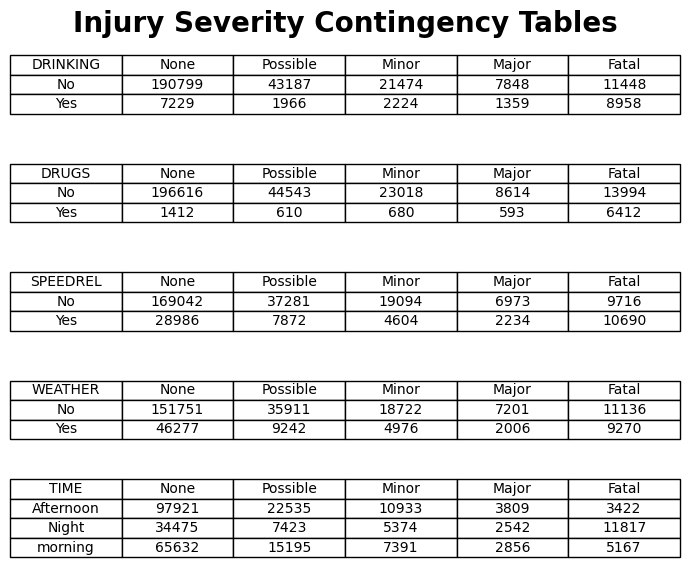

In [349]:
import matplotlib.pyplot as plt

contingency_tables_c = [ct.copy() for ct in contingency_tables]

# Convert index into a column for display
for df in contingency_tables_c:
    df.insert(0, df.index.name , df.index)  # Add index as a column
    df.reset_index(drop=True, inplace=True)  # Remove original index

# Create a single-column subplot grid (5 rows, 1 column)
fig, axes = plt.subplots(5, 1, figsize=(7, 6))  
axes = axes.ravel()  
fig.suptitle("Injury Severity Contingency Tables", fontsize=20, fontweight="bold", y=0.95)


# Loop through tables and add them to the subplots
for ax, df in zip(axes, contingency_tables_c[:5]):
    ax.axis("tight")
    ax.axis("off")  

    # Create table with index properly formatted
    table = ax.table(
        cellText=df.values, 
        colLabels=df.columns, 
        cellLoc="center", 
        loc="center"
    )

plt.tight_layout()
plt.savefig("assets/inj_sev_contingencies.png")
plt.show()

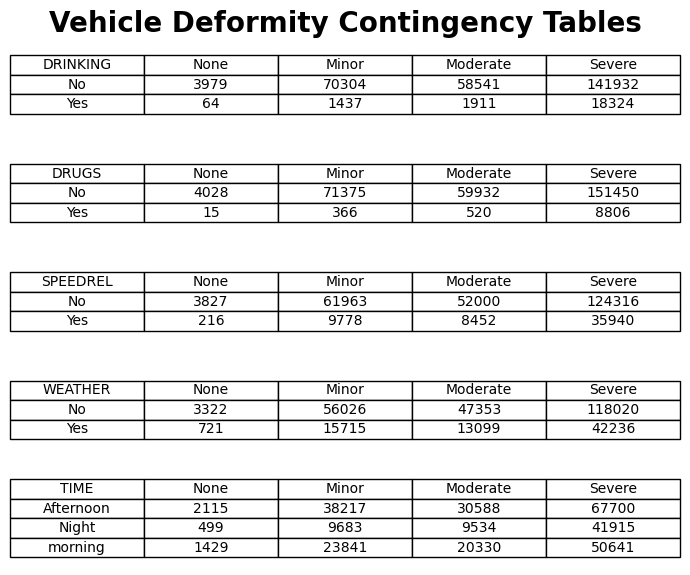

In [351]:
# Create a single-column subplot grid (5 rows, 1 column)
fig, axes = plt.subplots(5, 1, figsize=(7, 6))  
axes = axes.ravel()  
fig.suptitle("Vehicle Deformity Contingency Tables", fontsize=20, fontweight="bold", y=0.95)


# Loop through tables and add them to the subplots
for ax, df in zip(axes, contingency_tables_c[5::]):
    ax.axis("tight")
    ax.axis("off")  

    # Create table with index properly formatted
    table = ax.table(
        cellText=df.values, 
        colLabels=df.columns, 
        cellLoc="center", 
        loc="center"
    )

plt.tight_layout()
plt.savefig("assets/deformity_contingencies.png")
plt.show()

### Chi Squared Test for Independence Test Statistics

In [196]:
t_stats

,Injury Severity,Vehicle Deformity
Drinking,43037.2,6469.49
Drugs,44327.28,3344.22
Speed Related,16886.22,3585.52
Weather Related,566.9,271.39
Time,9719.19,4961.71


In [199]:
pd.read_csv("assets/contingencies/contingency_DRINKING_INJ_SEV.csv", index_col=0)

,None,Possible,Minor,Major,Fatal
DRINKING,,,,,
No,455844,72694,39217,17713,27222
Yes,9444,2033,3124,2398,8077
